In [1]:
import xarray as xr
import numpy as np
import pandas as pd
from scipy import signal as sg
import time
import os
import itertools
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature
from scipy.spatial import cKDTree
import cartopy.feature as cfeature
from sklearn.cluster import DBSCAN
from scipy.integrate import cumtrapz
import metpy.calc as mpcalc
from scipy import interpolate
from matplotlib import patches
from metpy.units import units
import matplotlib.colors as mcolors
import arrow
from matplotlib.collections import LineCollection

In [2]:
# 设置默认字体
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

# 常量
GRAVITY = 9.80665
def get_path_from_time(time):
    time_utc = arrow.get(time)
    path_u = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\u_component_of_wind\\era5.u_component_of_wind.{time_utc.format('YYYYMMDD')}.nc"
    path_v = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\v_component_of_wind\\era5.v_component_of_wind.{time_utc.format('YYYYMMDD')}.nc"
    path_h = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\geopotential\\era5.geopotential.{time_utc.format('YYYYMMDD')}.nc"
    path_r = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\relative_humidity\\era5.relative_humidity.{time_utc.format('YYYYMMDD')}.nc"
    path_t = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\temperature\\era5.temperature.{time_utc.format('YYYYMMDD')}.nc"
    path_sp = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\surface_pressure\\era5.surface_pressure.{time_utc.format('YYYYMMDD')}.nc"
    path_div = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\divergence\\era5.divergence.{time_utc.format('YYYYMMDD')}.nc"
    path_uwnd = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\10m_u_component_of_wind\\era5.10m_u_component_of_wind.{time_utc.format('YYYYMMDD')}.nc"
    path_vwnd = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\10m_v_component_of_wind\\era5.10m_v_component_of_wind.{time_utc.format('YYYYMMDD')}.nc"
    path_mslp = f"\\\\10.148.44.80\\data\\ERA5\\ERA5_60N_50E_-10N_150E\\{time_utc.year}\\mean_sea_level_pressure\\era5.mean_sea_level_pressure.{time_utc.format('YYYYMMDD')}.nc"
    path_r24 = f"http://10.148.8.71:7080/thredds/dodsC/cmpa/{time_utc.format('YYYYMMDD')}/R24H_FRT_{time_utc.format('YYYYMMDD')}12.NC"
    path_r3 = f"http://10.148.8.71:7080/thredds/dodsC/cmpa/{time_utc.format('YYYYMMDD')}/R03H_FRT_{time_utc.format('YYYYMMDDHH')}.NC"
    path_r1 = f"http://10.148.8.71:7080/thredds/dodsC/cmpa/{time_utc.format('YYYYMMDD')}/R01H_FRT_{time_utc.format('YYYYMMDDHH')}.NC"
    return {
        'uwnd': path_u,
        'vwnd': path_v,
        'hgt': path_h,
        'rhum': path_r,
        'temp': path_t,
        'spre': path_sp,
        'div': path_div,
        'uwndm': path_uwnd,
        'vwndm': path_vwnd,
        'mslp': path_mslp,
        'r24': path_r24,
        'r3': path_r3,
        'r1': path_r1
    }

config_var = {
    'uwnd': {'varname': 'u', 'lev_type':'multi'},
    'vwnd': {'varname': 'v', 'lev_type':'multi'},
    'hgt': {'varname': 'z', 'lev_type':'multi'},
    'rhum': {'varname': 'r', 'lev_type':'multi'},
    'temp': {'varname': 't', 'lev_type':'multi'},
    'div': {'varname': 'd', 'lev_type':'multi'},
    'uwndm': {'varname': 'uwnd', 'lev_type':None},
    'vwndm': {'varname': 'vwnd', 'lev_type':None},
    'mslp': {'varname': 'msl', 'lev_type':None},
    'spre': {'varname': 'sp', 'lev_type':None},
    'r24': {'varname': 'r24h_frt000', 'lev_type':'single'},
    'r3': {'varname': 'r03h_frt000', 'lev_type':'single'},
    'r1': {'varname': 'r01h_frt000', 'lev_type':'single'},
}

def get_var_list(path_dict, time, var_list=['uwnd', 'vwnd'],  lev=850, map_extent=None):
    """
    Get file list of ERA5 data
    :param path_dict: dict, path of data
    :param var_list: list, variable list
    :param time: str, time
    :param lev: int, level to select if applicable
    :return: var_dict: dict, file list
    """
    var_dict = {}
    for var in var_list:
        file_path = path_dict.get(var)
        ds = xr.open_dataset(file_path)
        varname = config_var.get(var).get('varname')
        da = ds[varname].sel(time=time)
        if config_var.get(var).get('lev_type')=='multi' and lev != -1:
            da = da.sel(level=lev)
        elif config_var.get(var).get('lev_type')=='single':
            da = da.isel(level=0)
        else:
            pass
        if map_extent is not None:
            da = da.sel(longitude=slice(map_extent[0], map_extent[1]), latitude=slice(map_extent[3], map_extent[2]))
        var_dict[var] = da
    return var_dict
    
def calculate_tick_interval(extent, axis='x'):
    """Calculate appropriate tick interval based on map extent."""
    range_extent = extent[1] - extent[0] if axis == 'x' else extent[3] - extent[2]
    if range_extent <= 10:
        return 1
    elif range_extent <= 20:
        return 2
    elif range_extent <= 40:
        return 5
    elif range_extent <= 80:
        return 10
    else:
        return 20

def calculate_skip(extent):
    """Calculate appropriate skip value for barbs based on map extent."""
    lon_range = extent[1] - extent[0]
    lat_range = extent[3] - extent[2]
    area = lon_range * lat_range
    if area <= 500:
        return 2
    elif area <= 1000:
        return 4
    elif area <= 2000:
        return 6
    else:
        return 8

def reverse_level(da):
    # 首先，获取 level 坐标数组，并反转其顺序
    new_levels = da.level[::-1]
    # 然后，使用 .reindex 方法重新索引 DataArray
    da_reversed = da.reindex(level=new_levels)
    return da_reversed

In [3]:
map_extent = [105, 130, 16, 35]

In [82]:
time_str='2024-07-26 00:00'
path_dict = get_path_from_time(time_str)
var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd', 'temp', 'hgt', 'rhum', 'temp'], 850, map_extent)

In [83]:
uwnd = var_dict.get('uwnd')
vwnd = var_dict.get('vwnd')

In [48]:
print(uwnd)

<xarray.DataArray 'u' (latitude: 77, longitude: 101)>
array([[ 2.837908e-01,  5.630013e-01,  8.166630e-01, ...,  2.637169e-01,
         1.706469e-01,  1.560476e-01],
       [ 5.411024e-01,  6.761453e-01,  8.495113e-01, ...,  4.005847e-01,
         2.746663e-01,  2.764912e-01],
       [ 8.677603e-01,  8.513361e-01,  8.896592e-01, ...,  5.721258e-01,
         6.268729e-01,  7.381921e-01],
       ...,
       [ 1.441768e+01,  1.490310e+01,  1.539400e+01, ...,  1.552987e-02,
        -1.123210e+00, -1.743678e+00],
       [ 1.507099e+01,  1.534473e+01,  1.575351e+01, ...,  1.917982e-02,
        -1.196207e+00, -1.937118e+00],
       [ 1.640682e+01,  1.649807e+01,  1.666413e+01, ...,  3.742886e-02,
        -1.208981e+00, -1.980916e+00]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 105.0 105.2 105.5 105.8 ... 129.5 129.8 130.0
  * latitude   (latitude) float32 35.0 34.75 34.5 34.25 ... 16.5 16.25 16.0
    level      int32 850
    time       datetime64[ns] 2024-07-26
Attributes

In [84]:
uwnd = uwnd.sortby('latitude')
vwnd = vwnd.sortby('latitude')

In [12]:
print(uwnd)

<xarray.DataArray 'u' (latitude: 77, longitude: 101)>
array([[ 1.640682e+01,  1.649807e+01,  1.666413e+01, ...,  3.742886e-02,
        -1.208981e+00, -1.980916e+00],
       [ 1.507099e+01,  1.534473e+01,  1.575351e+01, ...,  1.917982e-02,
        -1.196207e+00, -1.937118e+00],
       [ 1.441768e+01,  1.490310e+01,  1.539400e+01, ...,  1.552987e-02,
        -1.123210e+00, -1.743678e+00],
       ...,
       [ 8.677603e-01,  8.513361e-01,  8.896592e-01, ...,  5.721258e-01,
         6.268729e-01,  7.381921e-01],
       [ 5.411024e-01,  6.761453e-01,  8.495113e-01, ...,  4.005847e-01,
         2.746663e-01,  2.764912e-01],
       [ 2.837908e-01,  5.630013e-01,  8.166630e-01, ...,  2.637169e-01,
         1.706469e-01,  1.560476e-01]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 105.0 105.2 105.5 105.8 ... 129.5 129.8 130.0
  * latitude   (latitude) float32 16.0 16.25 16.5 16.75 ... 34.5 34.75 35.0
    level      int32 850
    time       datetime64[ns] 2024-07-26
Attributes

In [85]:
latitude = uwnd.latitude
longitude = uwnd.longitude

In [23]:
gridUnit = (latitude[1] - latitude[0]).item()
print(gridUnit)

0.25


In [18]:
# 1. 通过uwnd计算风速从南到北由正值转变为负值所对应的位置(dataArray的latitude从北到南排列）
sign_change_u = np.diff(np.sign(uwnd), axis=0) 
shear_u_index = np.where(sign_change_u < 0) # 这将会返回latitude, longitude的索引位置，
# 2. 通过vwnd计算风速从西到东由负值转变为正值所对应的位置
sign_change_v = np.diff(np.sign(vwnd), axis=1) 
shear_v_index = np.where(sign_change_v > 0) # 这将会返回latitude, longitude的索引位置
# 根据索引值从经纬度数组中获取切变位置
shear_u_latitude = latitude[shear_u_index[0]] + gridUnit/2.0 # 由于diff函数会使得数组纬度维长度减一，因此需要减去gridUnit/2.0
shear_u_longitude = longitude[shear_u_index[1]]
shear_u = np.vstack([shear_u_latitude, shear_u_longitude]).T  # 垂直堆叠并转置，使每一行代表一个点的[latitude, longitude]

shear_v_latitude = latitude[shear_v_index[0]]
shear_v_longitude = longitude[shear_v_index[1]] + gridUnit/2.0 # 由于diff函数会使得数组经度维长度减一，因此需要加上gridUnit/2.0
shear_v = np.vstack([shear_v_latitude, shear_v_longitude]).T  # 垂直堆叠并转置，使每一行代表一个点的[latitude, longitude]

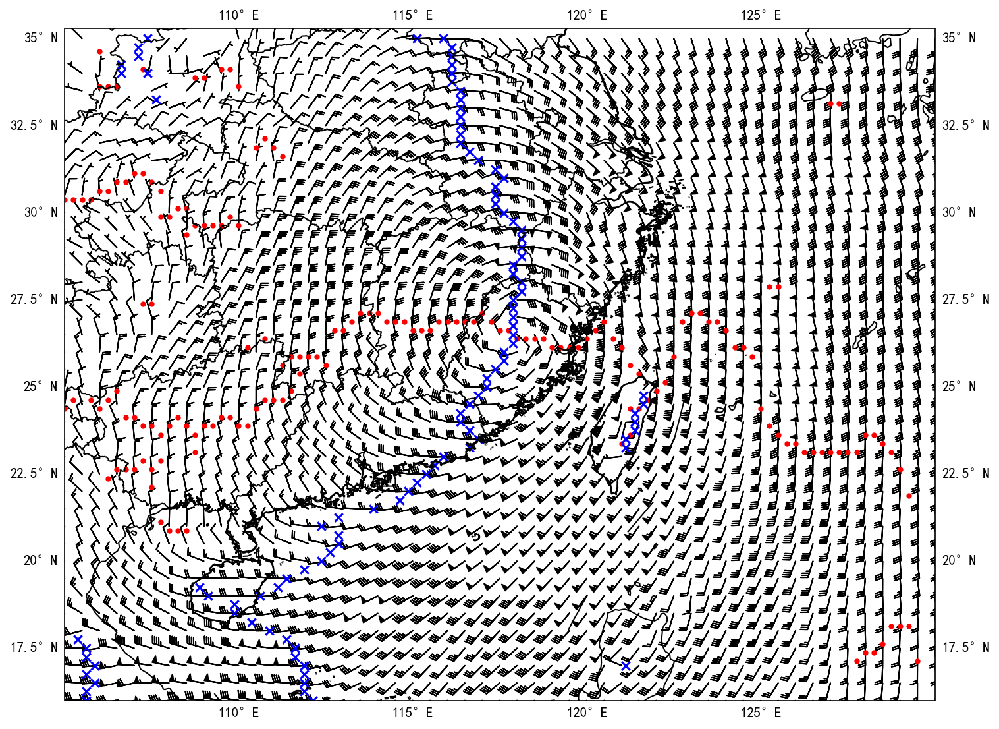

In [23]:
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})

# 添加shear_u和shear_v散点图
# ax.scatter(shear_u[:, 1], shear_u[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker="_") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
# ax.scatter(shear_v[:, 1], shear_v[:, 0], color='b', label='Shear V', transform=ccrs.PlateCarree(),marker="|")
ax.scatter(shear_u[:, 1], shear_u[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker=".") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
ax.scatter(shear_v[:, 1], shear_v[:, 0], color='b', label='Shear V', transform=ccrs.PlateCarree(),marker="x")
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.show()

In [24]:
# 创建基于 shear_v 的k-d树
tree = cKDTree(shear_v)

# 查询每个 shear_u 点到 shear_v 的最近点的距离和索引，距离上限设置为 0.5
distances, indices = tree.query(shear_u, distance_upper_bound=0.5)

# 筛选出在距离上限内的点
valid_indices = indices != len(shear_v)  # 超过距离上限的点，query方法会返回len(shear_v)作为索引值

# 获取在距离上限内的距离和对应的 shear_u 和 shear_v 的位置值
valid_distances = distances[valid_indices]
valid_shear_u = shear_u[valid_indices]
valid_shear_v = shear_v[indices[valid_indices]]

print('Distances:\n', valid_distances)
print('Positions in shear_u:\n', valid_shear_u)
print('Positions in shear_v:\n', valid_shear_v)

Distances:
 [0.1767767  0.1767767  0.1767767  0.1767767  0.1767767  0.39528471
 0.1767767  0.39528471 0.39528471 0.1767767  0.39528471 0.1767767 ]
Positions in shear_u:
 [[ 23.375 121.   ]
 [ 23.625 121.25 ]
 [ 24.375 121.25 ]
 [ 24.375 121.5  ]
 [ 24.625 121.75 ]
 [ 24.875 122.   ]
 [ 26.375 118.   ]
 [ 26.375 118.25 ]
 [ 26.625 117.5  ]
 [ 26.625 117.75 ]
 [ 33.625 106.5  ]
 [ 34.125 107.25 ]]
Positions in shear_v:
 [[ 23.25  121.125]
 [ 23.5   121.125]
 [ 24.25  121.375]
 [ 24.25  121.375]
 [ 24.5   121.625]
 [ 24.75  121.625]
 [ 26.25  117.875]
 [ 26.25  117.875]
 [ 26.5   117.875]
 [ 26.5   117.875]
 [ 34.    106.625]
 [ 34.    107.375]]


In [25]:
# 找到距离最小值
min_distance = np.min(valid_distances)

# 找到最小距离在数组中所有的位置
min_distance_positions_in_valid_distances = np.where(valid_distances == min_distance)

# 获取这些最小距离对应的shear_u和shear_v的位置值
nearest_shear_u_positions = valid_shear_u[min_distance_positions_in_valid_distances]
nearest_shear_v_positions = valid_shear_v[min_distance_positions_in_valid_distances]

print('Nearest distances:', min_distance)
print('Positions in shear_u:\n', nearest_shear_u_positions)
print('Positions in shear_v:\n', nearest_shear_v_positions)

Nearest distances: 0.1767766952966369
Positions in shear_u:
 [[ 23.375 121.   ]
 [ 23.625 121.25 ]
 [ 24.375 121.25 ]
 [ 24.375 121.5  ]
 [ 24.625 121.75 ]
 [ 26.375 118.   ]
 [ 26.625 117.75 ]
 [ 34.125 107.25 ]]
Positions in shear_v:
 [[ 23.25  121.125]
 [ 23.5   121.125]
 [ 24.25  121.375]
 [ 24.25  121.375]
 [ 24.5   121.625]
 [ 26.25  117.875]
 [ 26.5   117.875]
 [ 34.    107.375]]


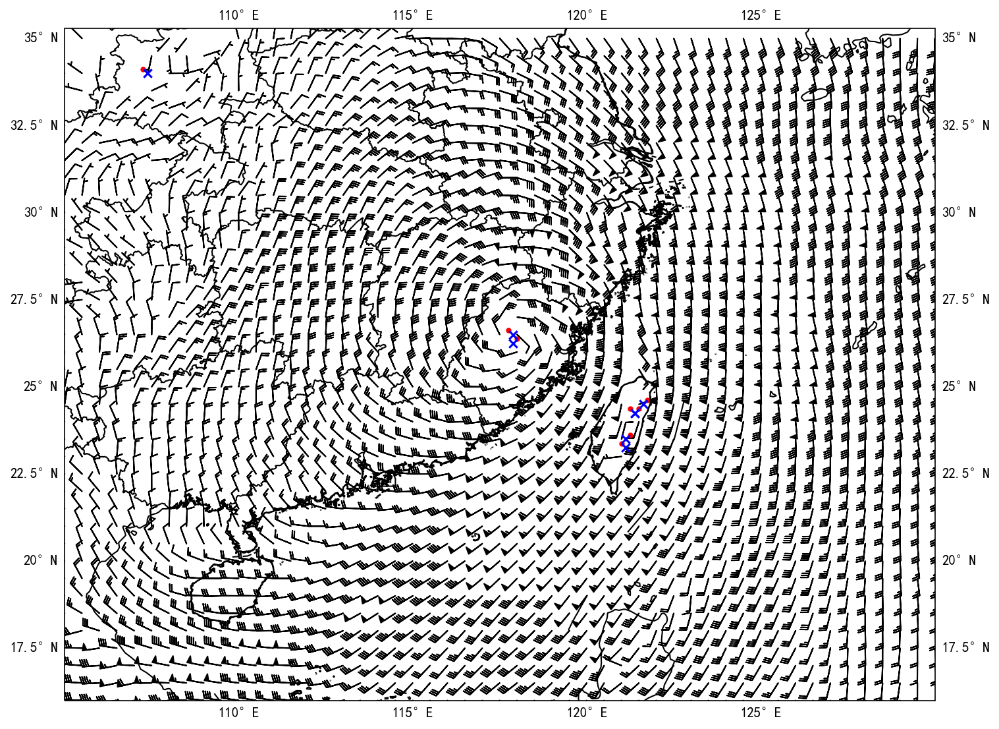

In [26]:
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})

# 添加shear_u和shear_v散点图
# ax.scatter(shear_u[:, 1], shear_u[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker="_") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
# ax.scatter(shear_v[:, 1], shear_v[:, 0], color='b', label='Shear V', transform=ccrs.PlateCarree(),marker="|")
ax.scatter(nearest_shear_u_positions[:, 1], nearest_shear_u_positions[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker=".") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
ax.scatter(nearest_shear_v_positions[:, 1], nearest_shear_v_positions[:, 0], color='b', label='Shear V', transform=ccrs.PlateCarree(),marker="x")
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.show()

In [27]:
# 合并nearest_shear_u_positions和nearest_shear_v_positions为center_position
center_position = np.vstack([nearest_shear_u_positions, nearest_shear_v_positions])

# 使用DBSCAN进行聚类，eps和min_samples参数需要根据你的数据调整
clustering = DBSCAN(eps=gridUnit*2, min_samples=2).fit(center_position)

# 找到所有的类别（忽略-1，-1表示噪声点）
labels = set(clustering.labels_)
if -1 in labels:
    labels.remove(-1)

# 对每一组进行平均
average_positions = np.array([np.mean(center_position[clustering.labels_==label], axis=0) for label in labels])

print('Average positions:\n', average_positions)

Average positions:
 [[ 23.4375   121.125   ]
 [ 24.395834 121.479164]
 [ 26.4375   117.875   ]
 [ 34.0625   107.3125  ]]


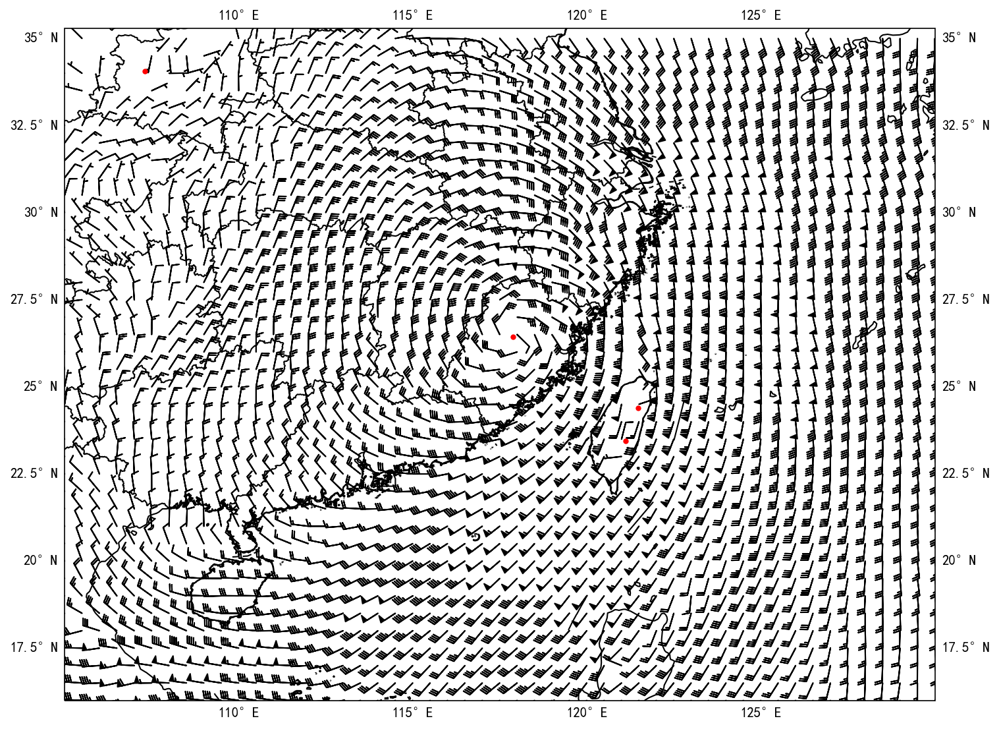

In [28]:
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})

# 添加shear_u和shear_v散点图
# ax.scatter(shear_u[:, 1], shear_u[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker="_") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
# ax.scatter(shear_v[:, 1], shear_v[:, 0], color='b', label='Shear V', transform=ccrs.PlateCarree(),marker="|")
ax.scatter(average_positions[:, 1], average_positions[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker=".") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.show()

In [30]:
center_vor = np.empty(average_positions.shape[0])
vorticity = mpcalc.vorticity(uwnd, vwnd)* 1e5
# 计算涡度，判断
for i, position in enumerate(average_positions):
    center_vor[i] = vorticity.sel(longitude=position[1], latitude=position[0], method="nearest")
print(center_vor)

[45.91381845 35.46626448 58.45452297 -0.35694632]


In [32]:
center_vor

array([45.91381845, 35.46626448, 58.45452297, -0.35694632])

In [41]:
# find the max in center_vor
max_vor_index = np.nanargmax(center_vor)
ty_center = average_positions[max_vor_index]
print(ty_center)

[ 26.4375 117.875 ]


In [40]:
average_positions[index]

array([[ 23.4375  , 121.125   ],
       [ 24.395834, 121.479164],
       [ 26.4375  , 117.875   ]], dtype=float32)

In [38]:
# 根据涡度值筛选索引
# 阈值的英文单词
vor_threshold = 20
index = center_vor > vor_threshold

# 使用这个索引来筛选average_positions中的相应位置
filter_positions = average_positions[index]

# 对涡度进行同样的筛选
filter_vor = center_vor[index]

# 将筛选后的经纬度和涡度组合在一起
filter_center = np.hstack((filter_positions, filter_vor.reshape(-1,1)))

print(filter_center)# 经度，纬度，涡度

[[ 23.4375     121.125       45.91381845]
 [ 24.39583397 121.47916412  35.46626448]
 [ 26.4375     117.875       58.45452297]]


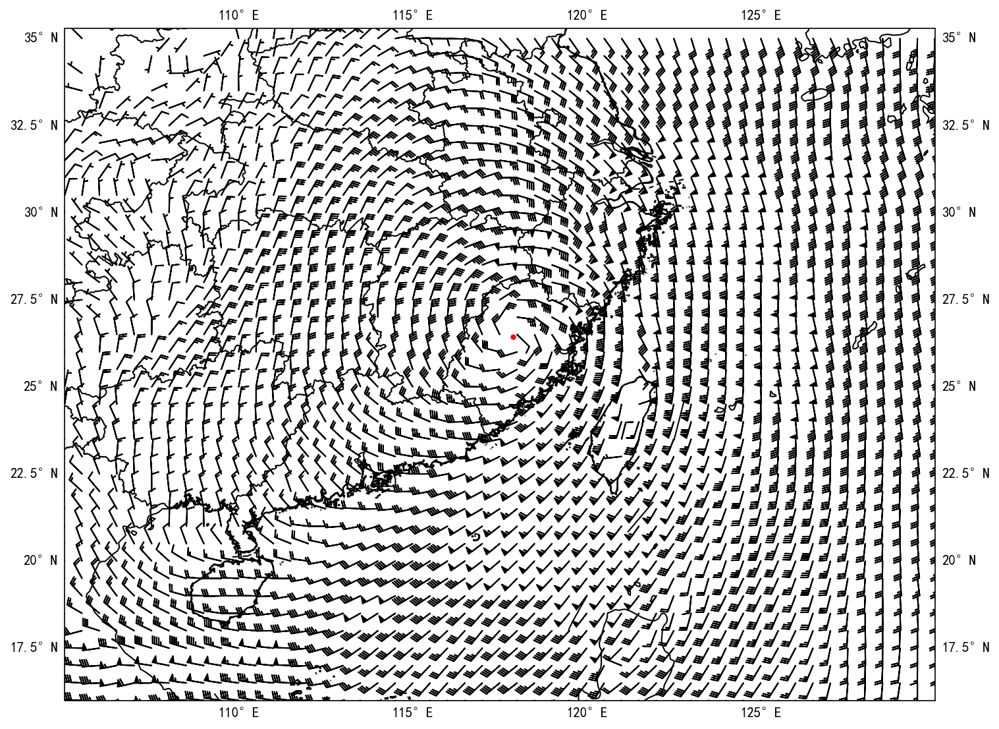

In [43]:
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})

# 添加shear_u和shear_v散点图
# ax.scatter(shear_u[:, 1], shear_u[:, 0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker="_") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
# ax.scatter(shear_v[:, 1], shear_v[:, 0], color='b', label='Shear V', transform=ccrs.PlateCarree(),marker="|")
ax.scatter(ty_center[1], ty_center[0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker=".") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.show()

In [4]:
def get_timeseries(stat_time='2024-07-25 00:00', end_time='2024-07-29 00:00', interval_hours=3):
    """
    Get timeseries list
    :param stat_time: start time
    :param end_time: end time
    :param interval_hours: interval hours
    :return: timeseries list
    """
    # Convert start and end time to pandas datetime
    start_time = pd.to_datetime(stat_time)
    end_time = pd.to_datetime(end_time)
    
    # Generate the time series
    time_series = pd.date_range(start=start_time, end=end_time, freq=f'{interval_hours}H')
    time_str_list = [time.strftime('%Y-%m-%d %H:%M') for time in time_series]
    return time_str_list

In [61]:
def compute_shear_vorticity(u, v, dx=1, dy=1):
    """
    计算切变涡度
    u: 东西分量
    v: 南北分量
    dx: x方向上的间隔（东西方向）
    dy: y方向上的间隔（南北方向）
    """
    # 计算dv/dx和du/dy
    dvdx = np.gradient(v, dx, axis=1)
    dudy = np.gradient(u, dy, axis=0)
    
    # 切变涡度计算公式
    shear_vorticity = dvdx - dudy
    
    return shear_vorticity

In [64]:
def compute_vorticity(u, v, dx=1, dy=1):
    """
    计算涡度
    u: 东西分量
    v: 南北分量
    dx: x方向上的间隔（东西方向）
    dy: y方向上的间隔（南北方向）
    """
    # 计算dv/dx和du/dy
    dvdx = np.gradient(v, dx, axis=1)
    dudy = np.gradient(u, dy, axis=0)
    
    # 涡度计算公式
    vorticity = dvdx - dudy
    
    return vorticity

In [76]:
def compute_curvature_vorticity(u, v, dx=1, dy=1):
    """
    计算曲率涡度
    u: 东西分量
    v: 南北分量
    dx: x方向上的间隔（东西方向）
    dy: y方向上的间隔（南北方向）
    """
    
    # 曲率涡度的计算
    curvature_vorticity = compute_vorticity(u, v, dx=1, dy=1) - compute_shear_vorticity(v, u, dx=1, dy=1)
    da = u.copy()
    da.data = curvature_vorticity
    return da

In [77]:
uwnd

<xarray.DataArray 'u' (latitude: 57, longitude: 81)>
array([[ -3.560307,  -2.831975,  -2.695312, ...,  -9.226181,  -9.086303,
         -8.857995],
       [ -2.680842,  -2.22262 ,  -2.126153, ..., -10.218191, -10.081529,
         -9.850005],
       [ -2.057018,  -1.558601,  -1.404252, ..., -11.345256, -11.134635,
        -10.867741],
       ...,
       [ 16.117512,  16.239704,  16.702747, ...,  19.013153,  18.508305,
         18.292858],
       [ 16.894077,  16.702747,  16.945526, ...,  19.427963,  18.83147 ,
         18.681946],
       [ 17.590252,  17.178656,  17.275124, ...,  19.635368,  19.185184,
         18.834686]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 105.0 105.2 105.5 105.8 ... 124.5 124.8 125.0
  * latitude   (latitude) float32 30.0 29.75 29.5 29.25 ... 16.5 16.25 16.0
    level      int32 850
    time       datetime64[ns] 2024-07-24
Attributes:
    units:          m s**-1
    long_name:      U component of wind
    standard_name:  eastward_wind

In [86]:
cur_vor = compute_curvature_vorticity(uwnd, vwnd)
shear_vor = compute_shear_vorticity(uwnd, vwnd)

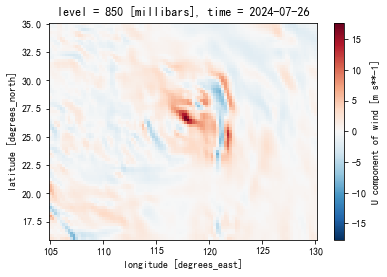

In [87]:
cur_vor.plot()

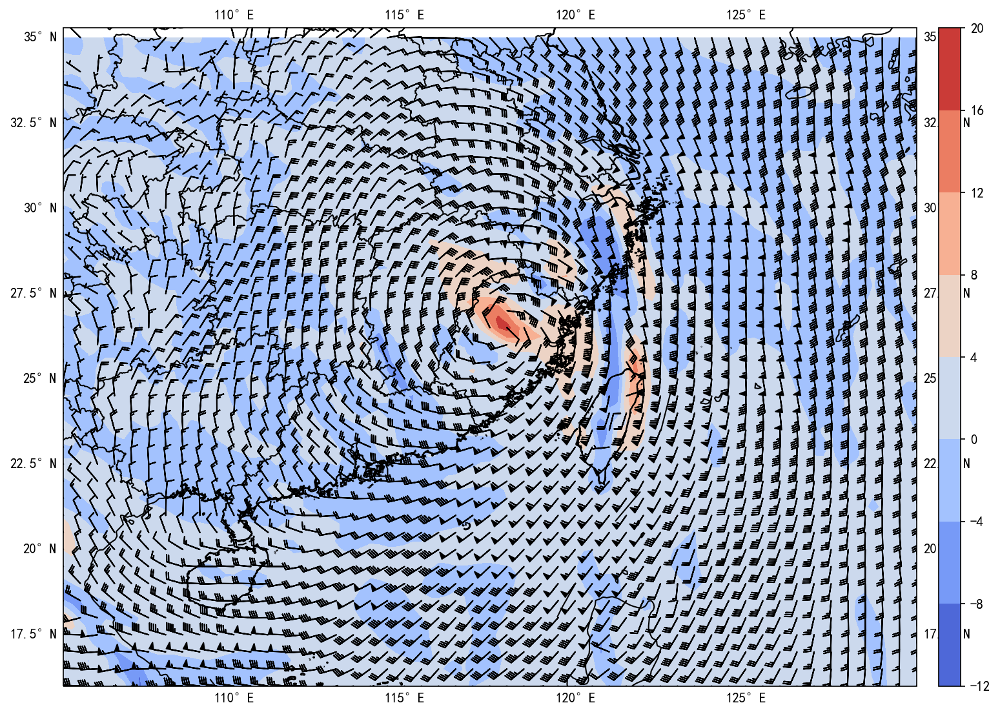

In [88]:
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 



cf = ax.contourf(longitude, latitude, cur_vor, cmap='coolwarm', transform=ccrs.PlateCarree()) # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
cb = fig.colorbar(cf, orientation='vertical', pad=0.02, aspect=30)
# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})

ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.show()

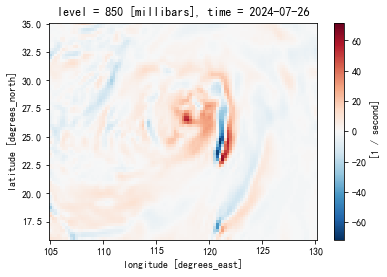

In [53]:
vorticity = mpcalc.vorticity(uwnd, vwnd)* 1e5
vorticity.plot()

In [35]:
uwnd

<xarray.DataArray 'u' (latitude: 77, longitude: 101)>
array([[ 1.640682e+01,  1.649807e+01,  1.666413e+01, ...,  3.742886e-02,
        -1.208981e+00, -1.980916e+00],
       [ 1.507099e+01,  1.534473e+01,  1.575351e+01, ...,  1.917982e-02,
        -1.196207e+00, -1.937118e+00],
       [ 1.441768e+01,  1.490310e+01,  1.539400e+01, ...,  1.552987e-02,
        -1.123210e+00, -1.743678e+00],
       ...,
       [ 8.677603e-01,  8.513361e-01,  8.896592e-01, ...,  5.721258e-01,
         6.268729e-01,  7.381921e-01],
       [ 5.411024e-01,  6.761453e-01,  8.495113e-01, ...,  4.005847e-01,
         2.746663e-01,  2.764912e-01],
       [ 2.837908e-01,  5.630013e-01,  8.166630e-01, ...,  2.637169e-01,
         1.706469e-01,  1.560476e-01]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 105.0 105.2 105.5 105.8 ... 129.5 129.8 130.0
  * latitude   (latitude) float32 16.0 16.25 16.5 16.75 ... 34.5 34.75 35.0
    level      int32 850
    time       datetime64[ns] 2024-07-26
Attributes:
    units:          m s**-1
    long_name:      U component of wind
    standard_name:  eastward_wind

In [34]:
print(cur_vor)

<xarray.DataArray (latitude: 77, longitude: 101)>
array([[-0.8277411 , -0.5181744 , -0.23492737, ...,  0.78418374,
         0.22614074,  0.4577876 ],
       [-0.5884527 , -0.3300399 , -0.18256886, ...,  0.4765494 ,
         0.6845832 ,  0.9058367 ],
       [-0.37561756, -0.3125954 , -0.20564137, ...,  0.33559427,
         0.8797437 ,  1.2620206 ],
       ...,
       [ 0.8563927 ,  0.17112996,  0.01057596, ...,  1.0944606 ,
         1.7744191 ,  2.115318  ],
       [ 0.33915755, -0.2171771 , -0.181112  , ...,  1.2549201 ,
         1.6875529 ,  1.9096249 ],
       [-0.7344246 , -0.96147794, -0.17931566, ...,  1.2833071 ,
         1.4506959 ,  1.5442367 ]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 105.0 105.2 105.5 105.8 ... 129.5 129.8 130.0
  * latitude   (latitude) float32 16.0 16.25 16.5 16.75 ... 34.5 34.75 35.0
    level      int32 850
    time       datetime64[ns] 2024-07-26


In [5]:
timeseries = get_timeseries(stat_time='2024-07-24 00:00', end_time='2024-07-29 00:00')

In [135]:
def get_max_vor_center(uwnd, vwnd):
    uwnd = uwnd.sortby('latitude')
    vwnd = vwnd.sortby('latitude')
    latitude = uwnd.latitude
    longitude = uwnd.longitude
    gridUnit = (latitude[1] - latitude[0]).item()
    # 1. 通过uwnd计算风速从南到北由正值转变为负值所对应的位置(dataArray的latitude从北到南排列）
    sign_change_u = np.diff(np.sign(uwnd), axis=0) 
    shear_u_index = np.where(sign_change_u < 0) # 这将会返回latitude, longitude的索引位置，
    # 2. 通过vwnd计算风速从西到东由负值转变为正值所对应的位置
    sign_change_v = np.diff(np.sign(vwnd), axis=1) 
    shear_v_index = np.where(sign_change_v > 0) # 这将会返回latitude, longitude的索引位置
    # 根据索引值从经纬度数组中获取切变位置
    shear_u_latitude = latitude[shear_u_index[0]] + gridUnit/2.0 # 由于diff函数会使得数组纬度维长度减一，因此需要减去gridUnit/2.0
    shear_u_longitude = longitude[shear_u_index[1]]
    shear_u = np.vstack([shear_u_latitude, shear_u_longitude]).T  # 垂直堆叠并转置，使每一行代表一个点的[latitude, longitude]
    
    shear_v_latitude = latitude[shear_v_index[0]]
    shear_v_longitude = longitude[shear_v_index[1]] + gridUnit/2.0 # 由于diff函数会使得数组经度维长度减一，因此需要加上gridUnit/2.0
    shear_v = np.vstack([shear_v_latitude, shear_v_longitude]).T  # 垂直堆叠并转置，使每一行代表一个点的[latitude, longitude]
    # 创建基于 shear_v 的k-d树
    tree = cKDTree(shear_v)

    # 查询每个 shear_u 点到 shear_v 的最近点的距离和索引，距离上限设置为 0.5
    distances, indices = tree.query(shear_u, distance_upper_bound=0.5)

    # 筛选出在距离上限内的点
    valid_indices = indices != len(shear_v)  # 超过距离上限的点，query方法会返回len(shear_v)作为索引值

    # 获取在距离上限内的距离和对应的 shear_u 和 shear_v 的位置值
    valid_distances = distances[valid_indices]
    valid_shear_u = shear_u[valid_indices]
    valid_shear_v = shear_v[indices[valid_indices]]
    # 找到距离最小值
    # size of valid_distances
    if len(valid_distances) == 0:
        return None
    
    min_distance = np.min(valid_distances)

    # 找到最小距离在数组中所有的位置
    min_distance_positions_in_valid_distances = np.where(valid_distances == min_distance)

    # 获取这些最小距离对应的shear_u和shear_v的位置值
    nearest_shear_u_positions = valid_shear_u[min_distance_positions_in_valid_distances]
    nearest_shear_v_positions = valid_shear_v[min_distance_positions_in_valid_distances]

    # 合并nearest_shear_u_positions和nearest_shear_v_positions为center_position
    center_position = np.vstack([nearest_shear_u_positions, nearest_shear_v_positions])

    # 使用DBSCAN进行聚类，eps和min_samples参数需要根据你的数据调整
    clustering = DBSCAN(eps=gridUnit*2, min_samples=2).fit(center_position)

    # 找到所有的类别（忽略-1，-1表示噪声点）
    labels = set(clustering.labels_)
    if -1 in labels:
        labels.remove(-1)

    # 对每一组进行平均
    average_positions = np.array([np.mean(center_position[clustering.labels_==label], axis=0) for label in labels])

    center_vor = np.empty(average_positions.shape[0])
    # cur_vor = compute_curvature_vorticity(uwnd, vwnd)
    vorticity = mpcalc.vorticity(uwnd, vwnd)* 1e5
    # 计算涡度，判断
    for i, position in enumerate(average_positions):
        center_vor[i] = vorticity.sel(longitude=position[1], latitude=position[0], method="nearest")
    # find the max in center_vor
    max_vor_index = np.nanargmax(center_vor)
    ty_center = average_positions[max_vor_index]
    return ty_center


2024-07-24 00:00
2024-07-24 03:00
2024-07-24 06:00
2024-07-24 09:00
2024-07-24 12:00
2024-07-24 15:00
2024-07-24 18:00
2024-07-24 21:00
2024-07-25 00:00
2024-07-25 03:00
2024-07-25 06:00
2024-07-25 09:00
2024-07-25 12:00
2024-07-25 15:00
2024-07-25 18:00
2024-07-25 21:00
2024-07-26 00:00
2024-07-26 03:00
2024-07-26 06:00
2024-07-26 09:00
2024-07-26 12:00
2024-07-26 15:00
2024-07-26 18:00
2024-07-26 21:00
2024-07-27 00:00
2024-07-27 03:00
2024-07-27 06:00
2024-07-27 09:00
2024-07-27 12:00
2024-07-27 15:00
2024-07-27 18:00
2024-07-27 21:00
2024-07-28 00:00
2024-07-28 03:00
2024-07-28 06:00
2024-07-28 09:00
2024-07-28 12:00
2024-07-28 15:00
2024-07-28 18:00
2024-07-28 21:00
2024-07-29 00:00
2024-07-29 03:00
2024-07-29 06:00


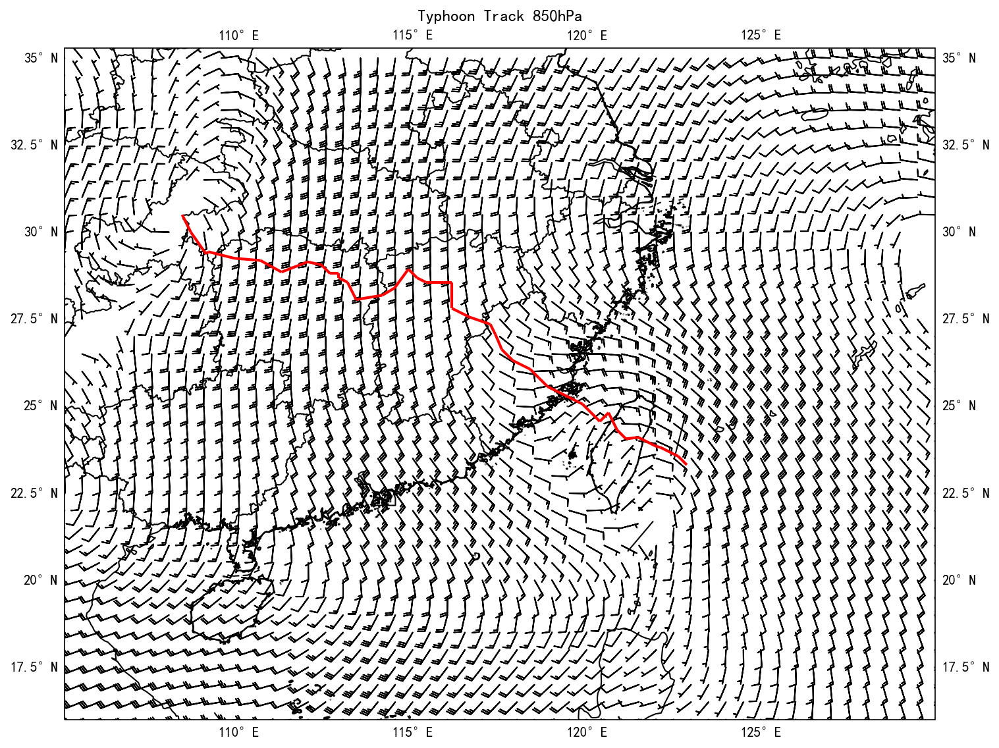

In [143]:
timeseries = get_timeseries(stat_time='2024-07-24 00:00', end_time='2024-07-29 06:00')
ty_tracks = []
lev = 850
for time_str in timeseries:
    print(time_str)
    try:
        path_dict = get_path_from_time(time_str)
        # var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], 850, [105, 125, 16, 30])
        var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], lev, map_extent)
        uwnd = var_dict.get('uwnd')
        vwnd = var_dict.get('vwnd')
        uwnd = uwnd.sortby('latitude')
        vwnd = vwnd.sortby('latitude')
        uwnd = mpcalc.smooth_gaussian(uwnd, 20)
        vwnd = mpcalc.smooth_gaussian(vwnd, 20)
        center = get_max_vor_center(uwnd, vwnd)
        ty_tracks.append(center)
    except Exception as e:
        print('error')
        raise
        # traceback.print_exc()
        continue
np_tracks = np.array(ty_tracks)


# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})
#绘制线条
# 交换纬度和经度的顺序
np_tracks_new = np_tracks[:, [1, 0]]

# 创建一个线段列表，包含连续的点对
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
# 创建 LineCollection
lc = LineCollection(segments, linewidths=2, colors='red', transform=ccrs.PlateCarree())
# lc = LineCollection(segments, colors='red', transform=ccrs.PlateCarree())

line = ax.add_collection(lc)
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.title(f'Typhoon Track {lev}hPa')
plt.show()
np.savetxt(f'ty_track_{lev}hPa.csv', np_tracks_new, delimiter=',', fmt='%.4f')

2024-07-24 00:00
2024-07-24 03:00
2024-07-24 06:00
2024-07-24 09:00
2024-07-24 12:00
2024-07-24 15:00
2024-07-24 18:00
2024-07-24 21:00
2024-07-25 00:00
2024-07-25 03:00
2024-07-25 06:00
2024-07-25 09:00
2024-07-25 12:00
2024-07-25 15:00
2024-07-25 18:00
2024-07-25 21:00
2024-07-26 00:00
2024-07-26 03:00
2024-07-26 06:00
2024-07-26 09:00
2024-07-26 12:00
2024-07-26 15:00
2024-07-26 18:00
2024-07-26 21:00
2024-07-27 00:00
2024-07-27 03:00
2024-07-27 06:00
2024-07-27 09:00
2024-07-27 12:00
2024-07-27 15:00
2024-07-27 18:00
2024-07-27 21:00
2024-07-28 00:00
2024-07-28 03:00
2024-07-28 06:00


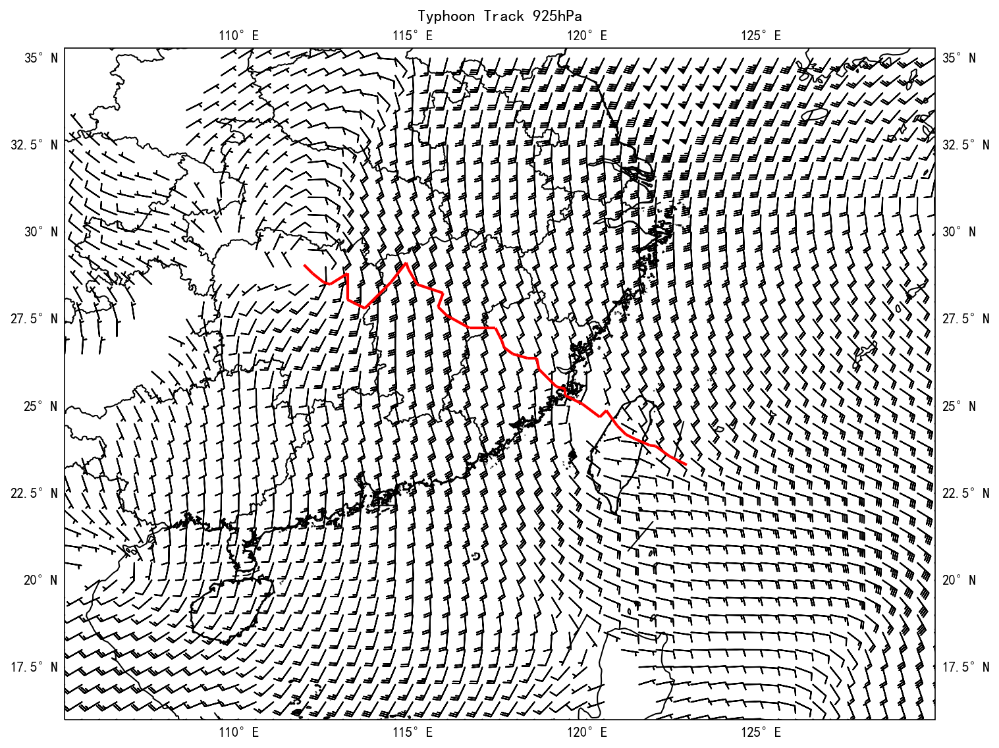

In [144]:
timeseries = get_timeseries(stat_time='2024-07-24 00:00', end_time='2024-07-28 06:00')
ty_tracks = []
lev = 925
for time_str in timeseries:
    print(time_str)
    try:
        path_dict = get_path_from_time(time_str)
        # var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], 850, [105, 125, 16, 30])
        var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], lev, map_extent)
        uwnd = var_dict.get('uwnd')
        vwnd = var_dict.get('vwnd')
        uwnd = uwnd.sortby('latitude')
        vwnd = vwnd.sortby('latitude')
        uwnd = mpcalc.smooth_gaussian(uwnd, 20)
        vwnd = mpcalc.smooth_gaussian(vwnd, 20)
        center = get_max_vor_center(uwnd, vwnd)
        # drop out empty center
        if (center is None) or len(center) == 0:
            continue
        else:
            ty_tracks.append(center)
    except Exception as e:
        print('error')
        raise
        # traceback.print_exc()
        continue

np_tracks = np.array(ty_tracks)


# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})
#绘制线条
# 交换纬度和经度的顺序
np_tracks_new = np_tracks[:, [1, 0]]

# 创建一个线段列表，包含连续的点对
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
# 创建 LineCollection
lc = LineCollection(segments, linewidths=2, colors='red', transform=ccrs.PlateCarree())
# lc = LineCollection(segments, colors='red', transform=ccrs.PlateCarree())

line = ax.add_collection(lc)
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.title(f'Typhoon Track {lev}hPa')
plt.show()
np.savetxt(f'ty_track_{lev}hPa.csv', np_tracks_new, delimiter=',', fmt='%.4f')

2024-07-24 00:00
2024-07-24 03:00
2024-07-24 06:00
2024-07-24 09:00
2024-07-24 12:00
2024-07-24 15:00
2024-07-24 18:00
2024-07-24 21:00
2024-07-25 00:00
2024-07-25 03:00
2024-07-25 06:00
2024-07-25 09:00
2024-07-25 12:00
2024-07-25 15:00
2024-07-25 18:00
2024-07-25 21:00
2024-07-26 00:00
2024-07-26 03:00
2024-07-26 06:00
2024-07-26 09:00
2024-07-26 12:00
2024-07-26 15:00
2024-07-26 18:00
2024-07-26 21:00
2024-07-27 00:00
2024-07-27 03:00
2024-07-27 06:00
2024-07-27 09:00
2024-07-27 12:00
2024-07-27 15:00
2024-07-27 18:00
2024-07-27 21:00
2024-07-28 00:00
2024-07-28 03:00
2024-07-28 06:00
2024-07-28 09:00
2024-07-28 12:00
2024-07-28 15:00
2024-07-28 18:00
2024-07-28 21:00
2024-07-29 00:00


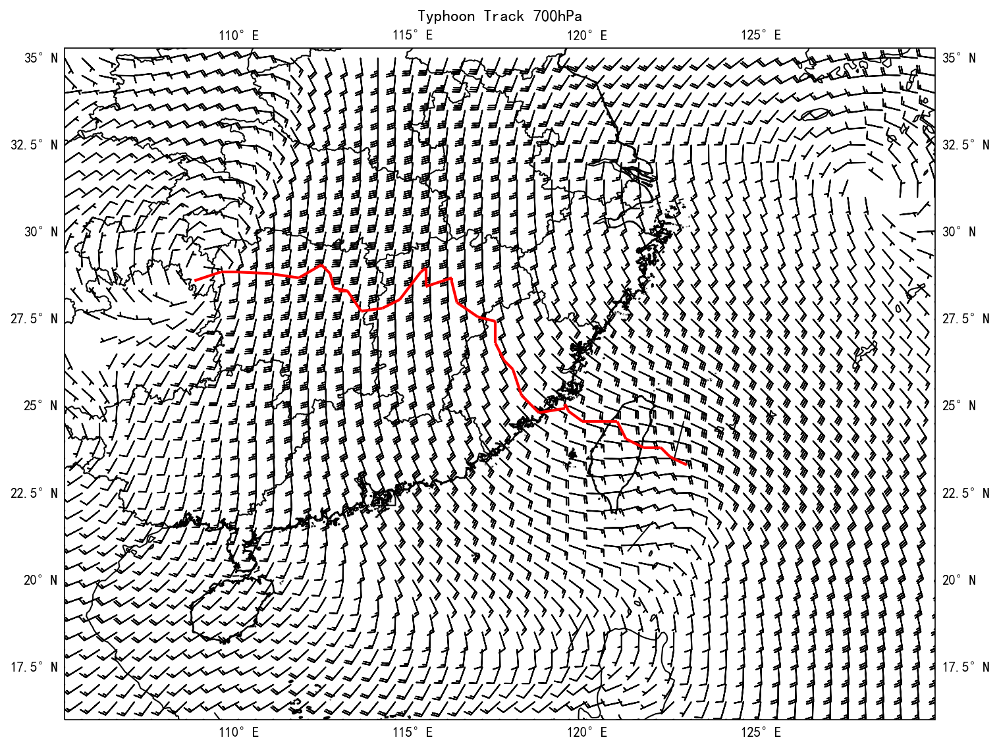

In [145]:
timeseries = get_timeseries(stat_time='2024-07-24 00:00', end_time='2024-07-29 00:00')
ty_tracks = []
lev = 700
for time_str in timeseries:
    print(time_str)
    try:
        path_dict = get_path_from_time(time_str)
        # var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], 850, [105, 125, 16, 30])
        var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], lev, map_extent)
        uwnd = var_dict.get('uwnd')
        vwnd = var_dict.get('vwnd')
        uwnd = uwnd.sortby('latitude')
        vwnd = vwnd.sortby('latitude')
        uwnd = mpcalc.smooth_gaussian(uwnd, 20)
        vwnd = mpcalc.smooth_gaussian(vwnd, 20)
        center = get_max_vor_center(uwnd, vwnd)
        ty_tracks.append(center)
    except Exception as e:
        print('error')
        raise
        # traceback.print_exc()
        continue
np_tracks = np.array(ty_tracks)


# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})
#绘制线条
# 交换纬度和经度的顺序
np_tracks_new = np_tracks[:, [1, 0]]

# 创建一个线段列表，包含连续的点对
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
# 创建 LineCollection
lc = LineCollection(segments, linewidths=2, colors='red', transform=ccrs.PlateCarree())
# lc = LineCollection(segments, colors='red', transform=ccrs.PlateCarree())

line = ax.add_collection(lc)
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.title(f'Typhoon Track {lev}hPa')
plt.show()
np.savetxt(f'ty_track_{lev}hPa.csv', np_tracks_new, delimiter=',', fmt='%.4f')

2024-07-24 00:00
2024-07-24 03:00
2024-07-24 06:00
2024-07-24 09:00
2024-07-24 12:00
2024-07-24 15:00
2024-07-24 18:00
2024-07-24 21:00
2024-07-25 00:00
2024-07-25 03:00
2024-07-25 06:00
2024-07-25 09:00
2024-07-25 12:00
2024-07-25 15:00
2024-07-25 18:00
2024-07-25 21:00
2024-07-26 00:00
2024-07-26 03:00
2024-07-26 06:00
2024-07-26 09:00
2024-07-26 12:00
2024-07-26 15:00
2024-07-26 18:00
2024-07-26 21:00
2024-07-27 00:00
2024-07-27 03:00
2024-07-27 06:00
2024-07-27 09:00
2024-07-27 12:00
2024-07-27 15:00
2024-07-27 18:00
2024-07-27 21:00
2024-07-28 00:00
2024-07-28 03:00
2024-07-28 06:00
2024-07-28 09:00
2024-07-28 12:00


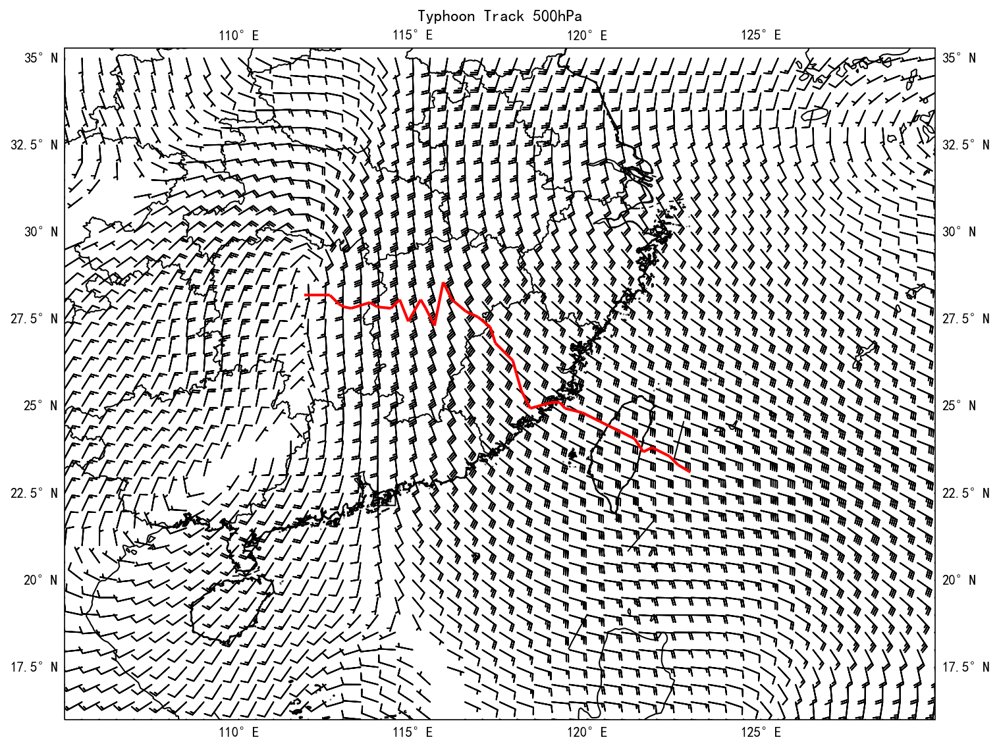

In [146]:
timeseries = get_timeseries(stat_time='2024-07-24 00:00', end_time='2024-07-28 12:00')
ty_tracks = []
lev = 500
for time_str in timeseries:
    print(time_str)
    try:
        path_dict = get_path_from_time(time_str)
        # var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], 850, [105, 125, 16, 30])
        var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], lev, map_extent)
        uwnd = var_dict.get('uwnd')
        vwnd = var_dict.get('vwnd')
        uwnd = uwnd.sortby('latitude')
        vwnd = vwnd.sortby('latitude')
        uwnd = mpcalc.smooth_gaussian(uwnd, 20)
        vwnd = mpcalc.smooth_gaussian(vwnd, 20)
        center = get_max_vor_center(uwnd, vwnd)
        ty_tracks.append(center)
    except Exception as e:
        print('error')
        raise
        # traceback.print_exc()
        continue
np_tracks = np.array(ty_tracks)


# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black') 

# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})
#绘制线条
# 交换纬度和经度的顺序
np_tracks_new = np_tracks[:, [1, 0]]

# 创建一个线段列表，包含连续的点对
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
# 创建 LineCollection
lc = LineCollection(segments, linewidths=2, colors='red', transform=ccrs.PlateCarree())
# lc = LineCollection(segments, colors='red', transform=ccrs.PlateCarree())

line = ax.add_collection(lc)
ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.title(f'Typhoon Track {lev}hPa')
plt.show()
np.savetxt(f'ty_track_{lev}hPa.csv', np_tracks_new, delimiter=',', fmt='%.4f')

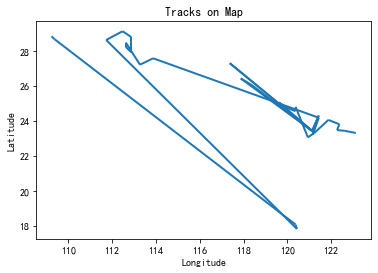

In [29]:
# 交换纬度和经度的顺序
np_tracks_new = np_tracks[:, [1, 0]]

# 创建一个线段列表，包含连续的点对
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)

# 创建 LineCollection
lc = LineCollection(segments, linewidths=2)

# 创建绘图
fig, ax = plt.subplots()

# 将 LineCollection 添加到绘图中
ax.add_collection(lc)

# 设置图的范围
ax.autoscale()
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Tracks on Map')

# 显示图
plt.show()

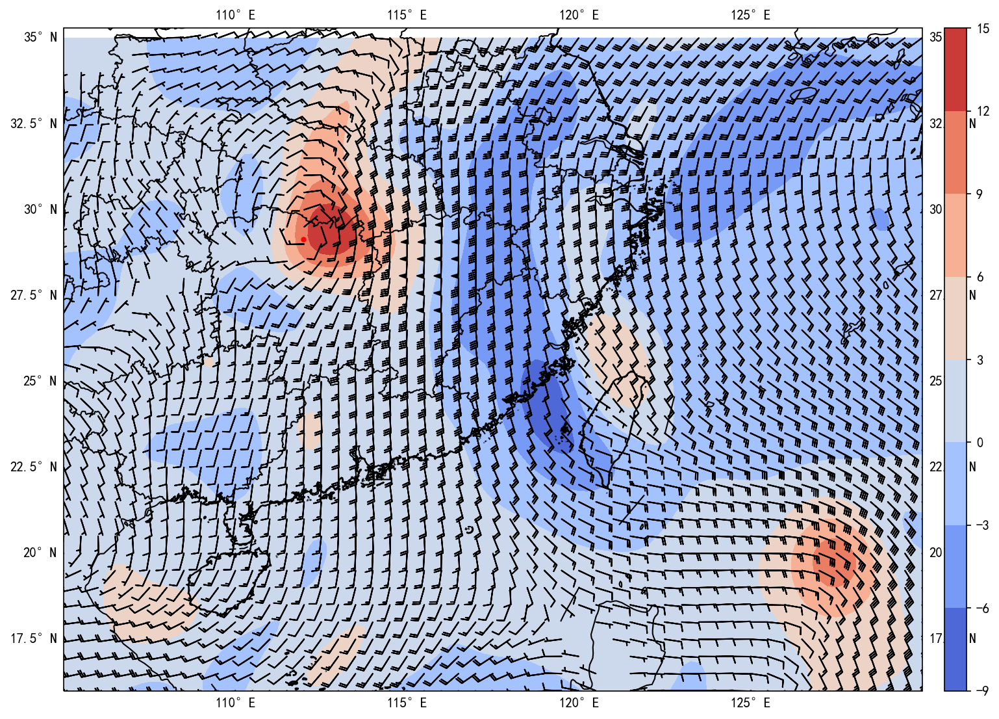

In [126]:
time_str = timeseries[-6]
path_dict = get_path_from_time(time_str)
# var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], 850, [105, 125, 16, 30])
var_dict = get_var_list(path_dict, time_str, ['uwnd', 'vwnd'], 850, map_extent)
uwnd = var_dict.get('uwnd')
vwnd = var_dict.get('vwnd')
uwnd = uwnd.sortby('latitude')
vwnd = vwnd.sortby('latitude')
uwnd = mpcalc.smooth_gaussian(uwnd, 20)
vwnd = mpcalc.smooth_gaussian(vwnd, 20)
longitude= uwnd.longitude
latitude = uwnd.latitude

# 计算
center = get_max_vor_center(uwnd, vwnd)
cur_vor = compute_curvature_vorticity(uwnd, vwnd)
shear_vor = compute_shear_vorticity(uwnd, vwnd)
vorticity = mpcalc.vorticity(uwnd, vwnd)* 1e5
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'

chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black')
# 填色
cf = ax.contourf(longitude, latitude, vorticity, cmap='coolwarm', transform=ccrs.PlateCarree()) # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
cb = fig.colorbar(cf, orientation='vertical', pad=0.02, aspect=30)
# 点
ax.scatter(center[1], center[0], color='r', label='Shear U', transform=ccrs.PlateCarree(),marker=".") # 注意这里我们使用了[:, 1]获取经度，[:, 0]获取纬度
# 添加风向杆图
skip = calculate_skip(map_extent)# 略过的网格数量
ax.barbs(longitude[::skip], latitude[::skip], uwnd[::skip,::skip], vwnd[::skip,::skip], transform=ccrs.PlateCarree(), length=5,barb_increments={'half':2, 'full':4, 'flag':20},sizes={'emptybarb':0})

ax.gridlines(draw_labels=True,linewidth=0)
# ax.legend()  # 添加图例
plt.show()

In [152]:
df_500 = pd.read_csv('ty_track_500hPa.csv', header=None, names=['lon', 'lat'])
df_700 = pd.read_csv('ty_track_700hPa.csv', header=None, names=['lon', 'lat'])
df_850 = pd.read_csv('ty_track_850hPa.csv', header=None, names=['lon', 'lat'])
df_925 = pd.read_csv('ty_track_925hPa.csv', header=None, names=['lon', 'lat'])

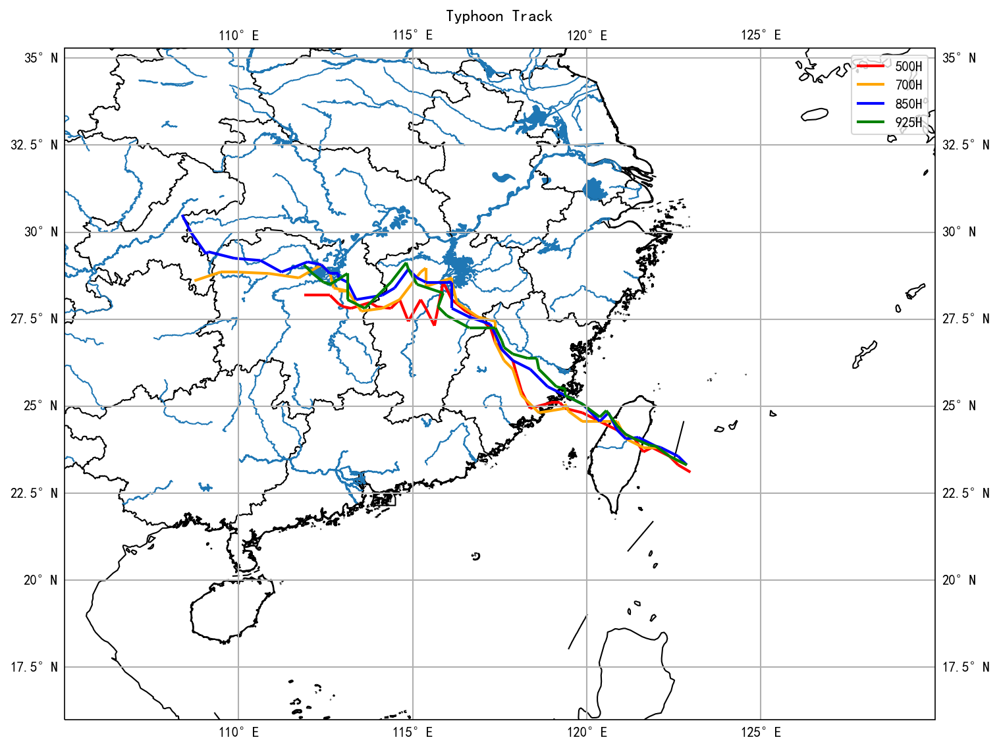

In [161]:
timeseries = get_timeseries(stat_time='2024-07-24 00:00', end_time='2024-07-28 12:00')
ty_tracks = []
lev = 500


# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
# add lake
ax.add_feature(cfeature.LAKES.with_scale('50m'), facecolor='tab:blue')
# add China
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'
chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black')
# add river
shpFileRiver4  = "D:/Document/气象台/2021/River4_polyline.shp"
rivermap4 = shpreader.Reader(shpFileRiver4).geometries()  # 读取地图数据
ax.add_geometries(rivermap4, ccrs.PlateCarree(),facecolor='none', edgecolor='tab:blue')
shpFileRiver3  = "D:/Document/气象台/2021/R3/hyd2_4p.shp"
rivermap3 = shpreader.Reader(shpFileRiver3).geometries()  # 读取地图数据
ax.add_geometries(rivermap3, ccrs.PlateCarree(),facecolor='none', edgecolor='tab:blue')
shpFileRiver1  = "D:/Document/气象台/2021/R1/hyd1_4p.shp"
rivermap1 = shpreader.Reader(shpFileRiver1).geometries()  # 读取地图数据
ax.add_geometries(rivermap1, ccrs.PlateCarree(),facecolor='none', edgecolor='tab:blue') 

# 创建一个线段列表，包含连续的点对
np_tracks_new = df_500.to_numpy()
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
lc = LineCollection(segments, linewidths=2, colors='red', label='500H', transform=ccrs.PlateCarree())
line = ax.add_collection(lc)

# 创建一个线段列表，包含连续的点对
np_tracks_new = df_700.to_numpy()
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
lc2 = LineCollection(segments, linewidths=2, colors='orange', label='700H', transform=ccrs.PlateCarree())
line2 = ax.add_collection(lc2)

# 创建一个线段列表，包含连续的点对
np_tracks_new = df_850.to_numpy()
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
lc3 = LineCollection(segments, linewidths=2, colors='blue', label='850H', transform=ccrs.PlateCarree())
line3 = ax.add_collection(lc3)

# 创建一个线段列表，包含连续的点对
np_tracks_new = df_925.to_numpy()
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
lc3 = LineCollection(segments, linewidths=2, colors='green', label='925H', transform=ccrs.PlateCarree())
line2 = ax.add_collection(lc3)

ax.gridlines(draw_labels=True,linewidth=1)
ax.legend()  # 添加图例
plt.title(f'Typhoon Track')
plt.show()


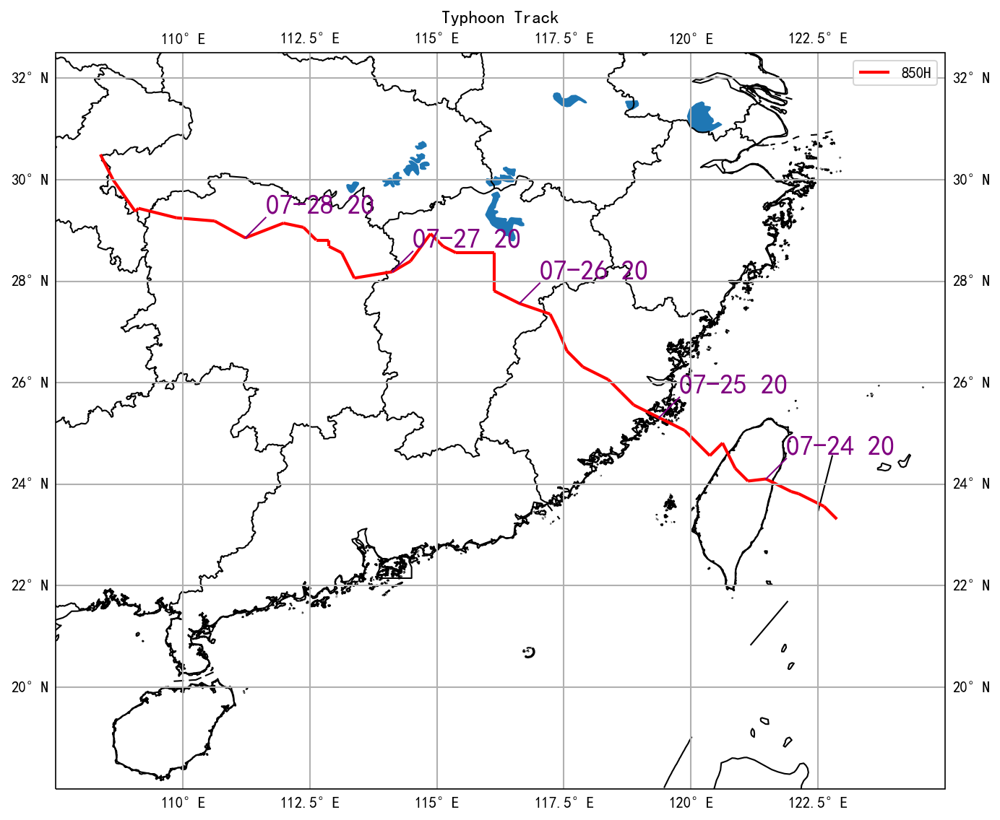

In [26]:
map_extent = [107.5, 125, 18, 32.5]
df_850 = pd.read_csv('ty_track_850hPa.csv', header=None, names=['lon', 'lat', 'time'])
df_850['time'] = pd.to_datetime(df_850['time'])
# 创建地图
fig = plt.figure(figsize=(15, 9),dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent(map_extent) # 设置地图显示范围，格式为[longitude_min, longitude_max, latitude_min, latitude_max]
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
# add lake
ax.add_feature(cfeature.LAKES.with_scale('50m'), facecolor='tab:blue')
# add China
shpFilePath02  = 'H:/github/python/seafog/data/shapefiles/china_basic_map/bou2_4l.shp'
chinamap = shpreader.Reader(shpFilePath02).geometries()  # 读取地图数据
ax.add_geometries(chinamap, ccrs.PlateCarree(),facecolor='none', edgecolor='black')
# # add river
# shpFileRiver4  = "D:/Document/气象台/2021/River4_polyline.shp"
# rivermap4 = shpreader.Reader(shpFileRiver4).geometries()  # 读取地图数据
# ax.add_geometries(rivermap4, ccrs.PlateCarree(),facecolor='none', edgecolor='tab:blue')
# shpFileRiver3  = "D:/Document/气象台/2021/R3/hyd2_4p.shp"
# rivermap3 = shpreader.Reader(shpFileRiver3).geometries()  # 读取地图数据
# ax.add_geometries(rivermap3, ccrs.PlateCarree(),facecolor='none', edgecolor='tab:blue')
# shpFileRiver1  = "D:/Document/气象台/2021/R1/hyd1_4p.shp"
# rivermap1 = shpreader.Reader(shpFileRiver1).geometries()  # 读取地图数据
# ax.add_geometries(rivermap1, ccrs.PlateCarree(),facecolor='none', edgecolor='tab:blue') 

# 创建一个线段列表，包含连续的点对
np_tracks_new = df_850[['lon', 'lat']].to_numpy()
segments = np.array([np_tracks_new[:-1], np_tracks_new[1:]]).transpose(1, 0, 2)
lc3 = LineCollection(segments, linewidths=2, colors='red', label='850H', transform=ccrs.PlateCarree())
line3 = ax.add_collection(lc3)

# 绘制时间标注
# Filter data for times divisible by 12 (i.e., 00:00 and 12:00)
# df_filtered = df_850[df_850['time'].dt.hour % 12 == 0]
df_filtered = df_850[df_850['time'].dt.hour  == 12]
# Add time annotations and connect with lines
for index, row in df_filtered.iterrows():
    # Position for the text
    text_x = row['lon'] + 0.4
    text_y = row['lat'] + 0.4
    time_bjt = row['time'] + pd.Timedelta('8 hours')
    ax.text(text_x, text_y, time_bjt.strftime('%m-%d %H'), 
            fontsize=18, ha='left', va='bottom', transform=ccrs.PlateCarree(), color='purple')
    
    # Draw a line connecting the typhoon point to the text
    ax.plot([row['lon'], text_x], [row['lat'], text_y], color='purple', linewidth=1, transform=ccrs.PlateCarree())

ax.gridlines(draw_labels=True,linewidth=1)
ax.legend()  # 添加图例
plt.title(f'Typhoon Track')
plt.show()

In [15]:
arrow.get(df_850['time'][0])

<Arrow [2024-07-24T00:00:00+00:00]>